# Introduction

Hello! This Kernel is meant to give a grasp of a problem of tempo and beat tracking. 

The **beat** is often described as a sequence of perceived pulse positions, which are typically equally spaced in time: the term **tempo** refers to the rate of the pulse and is given by the reciprocal of the beat period. 

The notebook will be divided into different sections, introducing and analyzing some key techniques used in tempo estimation and beat tracking.

# Content

* [1. What is Onset Detection?](#1-what-is-onset-detection)
* [2. Novelty Functions](#2-novelty-functions)
    * [2.1 Energy-based novelty function](#2-1-energy-based-novelty-functions)
    * [2.2 Spectral-based novelty function](#2-2-spectral-based-novelty-functions)
* [3. Peak Picking](#3-peak-picking)
* [4. Tempo Estimation](#4-tempo-estimation)
* [5. Tempogram](#5-tempogram)
    * [5.1 Fourier Tempogram](#5-1-fourier-tempogram)
    * [5.2 Autocorrelation Tempogram](#5-2-autocorrelation-tempogram)
* [6. Global Tempo Estimation](#6-global-tempo-estimation)
* [7. Resources](#7-resources)

All the dependencies we are gonna use are listed below:

In [1]:
import numpy as np
from matplotlib import pyplot as plt
import IPython.display as ipd
import librosa
import librosa.display

import warnings
warnings.filterwarnings("ignore")

<a id="1-what-is-onset-detection"></a>
# 1. What is Onset Detection?

The **onset** is the very instant the starts the beginning of the note or the musical event. In fact, at the beginning of a musical note there is often a sudden increase of energy, that is usually refered to as attack. The onset of the note refers to the single instant that marks the beginning of the transient. 

The **transient** may be described as an acoustic, noise-like component tipically occurring at the beginning of the note, of much higher level and frequency: for example, in the case of a piano, the transient corresponds to the initial phase where the hammer strikes the string, resulting then in the string vibration and generation of the sound. [1]

Things will be more clear as we will start visualising onsets on an audio plot. Let's load an audio file using `librosa.load`, and let's compute the spectrogram. 

*An important note: as this notebook focuses only on tempo and beat tracking, it will be assumed that the reader already has some basic knowledge about time and frequency domain, Fourier transforms and spectrograms.*

*If not, a very good resource may be found [in this video series](https://www.youtube.com/watch?v=-Yxj3yfvY-4).*

In [2]:
# Defining global frame length and hop length in samples
FRAME_LENGTH = 1024
HOP_LENGTH = 512

In [4]:
# QUEEN_PATH = "../input/beat-tracking-audio/AOBTD_Queen_intro.wav"
QUEEN_PATH = librosa.example('vibeace', hq=True)

# Waveform:
signal, sr = librosa.load(QUEEN_PATH)

# Log spectrogram:
spec = librosa.stft(signal)
log_spec = librosa.amplitude_to_db(np.abs(spec))

ipd.Audio(QUEEN_PATH)

Let's now plot the waveform and the spectrogram:

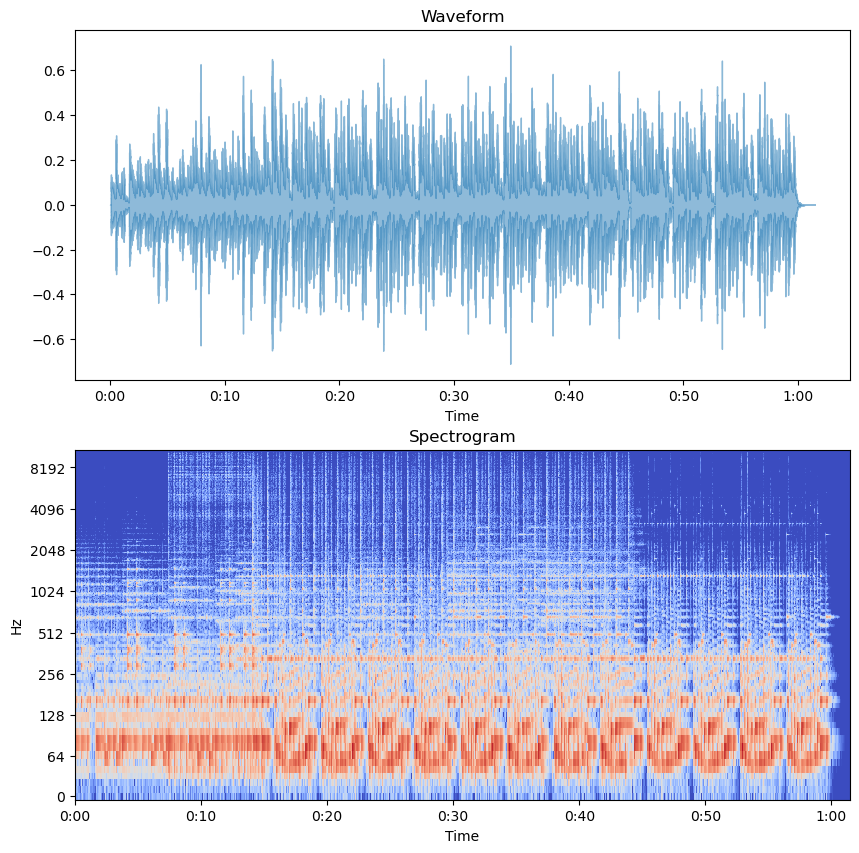

In [5]:
plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
librosa.display.waveshow(signal, alpha=0.5)
plt.title('Waveform')

plt.subplot(2, 1, 2)
librosa.display.specshow(log_spec, sr=sr, x_axis='time', y_axis='log')
plt.title('Spectrogram')

plt.show()

As you can see, there is a sudden increase of amplitude (for the waveform) and frequency response (for the spectrogram) at the beginning of every note.

Onset Detection is basically detecting the onsets onto the audio signal. For now we will look at an example using Librosa's built-in function `librosa.onset.onset_detect`, but then we will go deeper into it, providing an actual implementation and understanding of the problem.

In [7]:
# Onset detection
onset_frames = librosa.onset.onset_detect(
    y=signal,
    sr=sr,
    hop_length=HOP_LENGTH
)

onset_times = librosa.frames_to_time(onset_frames)
onset_samples = librosa.frames_to_samples(onset_frames, hop_length=HOP_LENGTH)

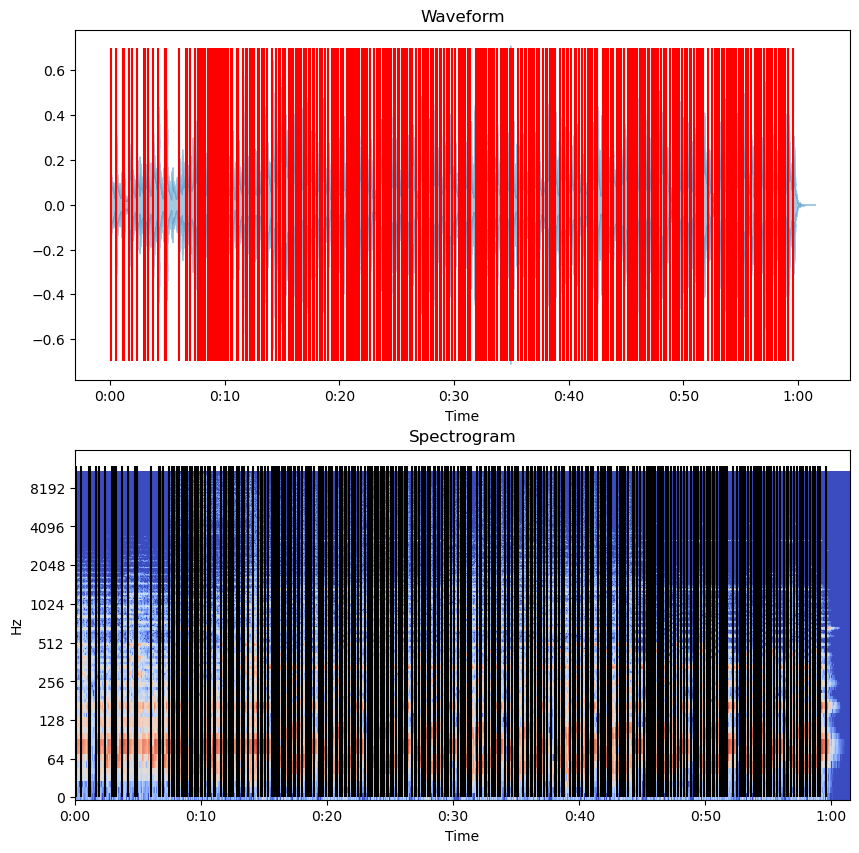

In [8]:
plt.figure(figsize=(10, 10))

# Plot onsets on the waveform
plt.subplot(2, 1, 1)
librosa.display.waveshow(signal, alpha=0.4)
plt.vlines(onset_times, -0.7, 0.7, color="r")
plt.title('Waveform')

# Plot onsets on the spectrogram
plt.subplot(2, 1, 2)
librosa.display.specshow(log_spec, sr=sr, x_axis='time', y_axis='log')
plt.vlines(onset_times, 0, 12000, color="k")
plt.title('Spectrogram')

plt.show()

So, to detect note onsets, we want to locate sudden changes in the audio signal that mark the beginning of transient regions: an increase in the signal's amplitude envelope will usually denote an onset candidate. However, that is not always the case: for example, notes can change from one pitch to another without changing amplitude (e.g. a violin playing slurred notes). 

Beat detection is not always an easy task, and there are many different ways to correctly depict the energy peaks.

The processing methods used to calculate these energy jumps are called **Novelty Functions**. 

<a id="2-novelty-functions"></a>
# 2. Novelty Functions

Novelty functions are functions which denote local changes in signal properties such as energy or spectral content. We will look at two novelty functions:

- **Energy-based** novelty functions;

- **Spectral-based** novelty functions. [2] [3]

There's more that these two functions (e.g. Phase-based novelty, Complex-domain novelty, ...) but at the moment I'll stick with the most used ones.

<a id="2-1-energy-based-novelty-functions"></a>
## 2.1 Energy-based Novelty Functions

We'll now calculate the **Root-Mean-Square** (RMS) Energy of the audio. In mathematics, RMS is defined as the square root of the mean of the square (the arithmetic mean of the squares of a set of $n$ numbers), namely:

$$
x_{RMS} = \sqrt{\frac{x_1^2+x_2^2+...+x_n^2}{n}}
$$

$$
= \sqrt{\frac{\sum_{i = 1}^{n}{x_i^2}}{n}}
$$


With audio, the signal value (amplitude) is squared, averaged over a period of time, then the square root of the result is calculated. The result is a value that, when squared, is related (proportional) to the effective power of the signal. Basically RMS Energy is taken by calculating the RMS of all samples in a frame.

I'll provide my own implementation of RMS to help you understend how RMS computation works, but for the sake of convenience we'll stick with `librosa.feature.rms` for the actual implementation of the novelty function.

In [9]:
def my_rms(signal, frame_length, hop_length):
     # Empty list
    rms = []
    
    for i in range(0, len(signal), hop_length):
        # RMS of the current frame is the RMS of all the samples in a frame [0 -> frame length for every frame i]
        rms_current_frame = np.sqrt(np.sum(signal[i:i+frame_length]**2) / frame_length)
        rms.append(rms_current_frame)
    return np.array(rms)

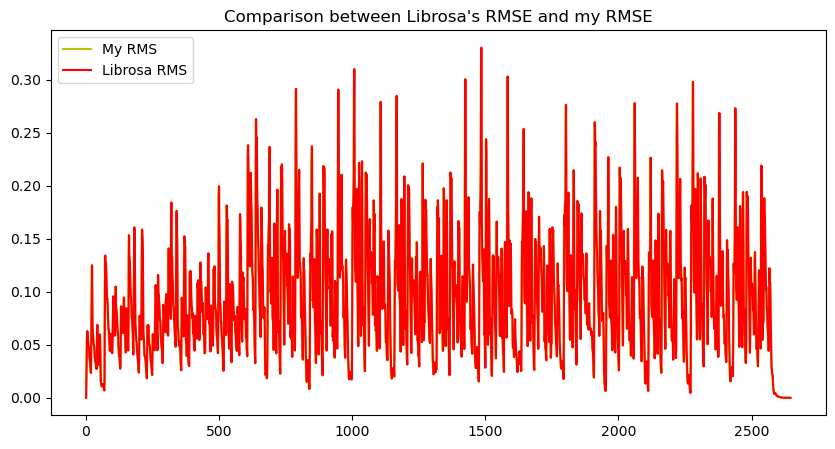

In [11]:
my_rmse = my_rms(signal, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).flatten()
rmse = librosa.feature.rms(y=signal, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).flatten()

frames = np.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

plt.figure(figsize=(10, 5))
plt.plot(my_rmse, color = 'y')
plt.plot(rmse, color = 'r')
plt.title("Comparison between Librosa's RMSE and my RMSE")
plt.legend(('My RMS', 'Librosa RMS'))
plt.show()


Coming back to the Energy-based novelty function, let's have a look at the local energy function we just plotted above:
- The percussive beats (kick drum, snare drum, bass) contain a lot of energy and eat up everything after them for a considerable period of time;
- The hi-hat strokes (e.g. the very last, weak energy peak) are not strongly captured.

So, to measure energy changes, we need to take a derivative of the local energy function. [1]

We'll do so by taking the difference between two subsequent energy values (this operation is also called **first-order difference**). Then since we are interested only in positive values, we'll calculate the energy novelty by setting negative differences to zero: this operation is called **half-wave rectification**.

$$
Δ_{Energy}(n):=|E(n+1)−E(n)|_{≥0}
$$

In [14]:
# Calculate RMS energy
rmse = librosa.feature.rms(y=signal, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).flatten()

# Copy the RMS array as an array of zeros
rmse_diff = np.zeros_like(rmse)

# Rewrite every value (a) of the array as the first-order difference (a[i+1] - a[i])
rmse_diff[1:] = np.diff(rmse)

# Take the maximum value between rmse_diff and an array of zeros (if value is negative, it will be set to zero)
energy_novelty = np.max([np.zeros_like(rmse_diff), rmse_diff], axis=0)

Let's now plot the result (red line for the energy novelty):

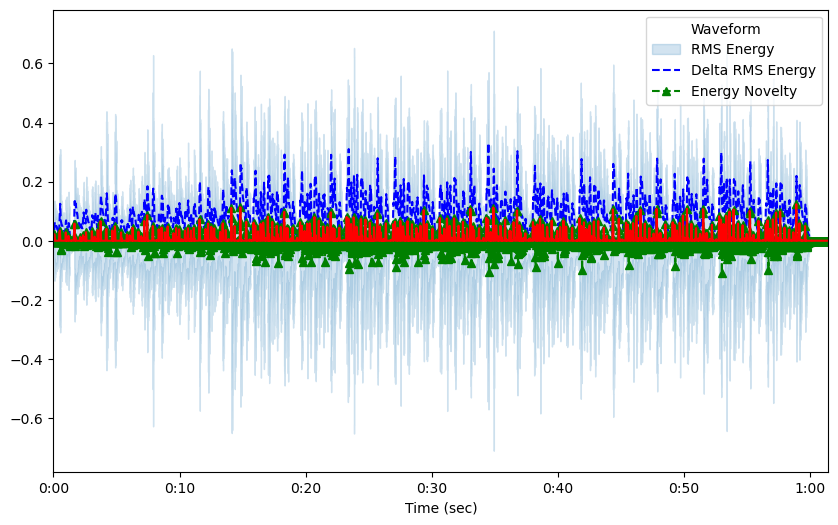

In [15]:
frames = np.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

plt.figure(figsize=(10, 6))
librosa.display.waveshow(signal, alpha=0.2)
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Waveform', 'RMS Energy', 'Delta RMS Energy', 'Energy Novelty'))
plt.show()

Now we can see that the beats are correctly measured as clear and striking energy peaks, and we can detect them by a simple peak-picking procedure.

However, the hi-hat strokes between the beats still don't show up, as the energy they contain is relatively little. 

To settle this problem, we could switch the visualisation to the logarithmic decibel scale: human perception of sound intensity is logarithmic in nature, and consequently even low-energy musical events (such as hi-hat strokes) may still be perceptually relevant.

In [16]:
# Calculate log(1 + x)
log_rmse = np.log1p(10*rmse)
log_rmse_diff = np.zeros_like(log_rmse)
log_rmse_diff[1:] = np.diff(log_rmse)

In [17]:
log_energy_novelty = np.max([np.zeros_like(log_rmse_diff), log_rmse_diff], axis=0)

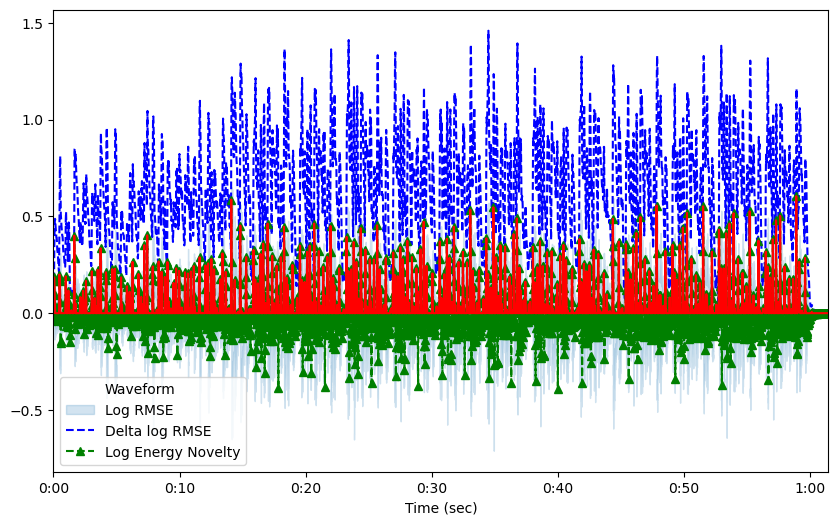

In [18]:
plt.figure(figsize=(10, 6))
librosa.display.waveshow(signal, alpha=0.2)
plt.plot(t, log_rmse, 'b--', t, log_rmse_diff, 'g--^', t, log_energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Waveform', 'Log RMSE', 'Delta log RMSE', 'Log Energy Novelty'))
plt.show()

<a id="2-2-spectral-based-novelty-functions"></a>
## 2.2 Spectral-based Novelty Functions

There's a couple of problems [1] with Energy Novelty function:
- Onset detection becomes an harder problem for polyphonic music with different notes happening at the same time;
- Energy fluctuations in the sustain phase of an instrument, such as vibrato, may be longer than energy increases in the attack of another instrument (e.g. violin);
- It is not sensitive to spectral fluctuations between notes where amplitude remains the same.

Let's for example try to compute the Energy Novelty of a classical music piece:

In [14]:
SHOSTAKOVICH_PATH = "../input/beat-tracking-audio/Shostakovich_Waltz_IncreasingTempo.wav"

signal, sr = librosa.load(SHOSTAKOVICH_PATH)

ipd.Audio(SHOSTAKOVICH_PATH)

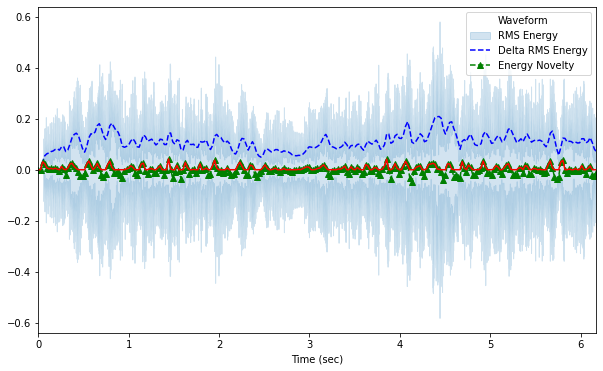

In [15]:
rmse = librosa.feature.rms(signal, frame_length=FRAME_LENGTH, hop_length=HOP_LENGTH).flatten()
rmse_diff = np.zeros_like(rmse)
rmse_diff[1:] = np.diff(rmse)

energy_novelty = np.max([np.zeros_like(rmse_diff), rmse_diff], axis=0)

frames = np.arange(len(rmse))
t = librosa.frames_to_time(frames, sr=sr)

plt.figure(figsize=(10, 6))
librosa.display.waveshow(signal, alpha=0.2)
plt.plot(t, rmse, 'b--', t, rmse_diff, 'g--^', t, energy_novelty, 'r-')
plt.xlim(0, t.max())
plt.xlabel('Time (sec)')
plt.legend(('Waveform', 'RMS Energy', 'Delta RMS Energy', 'Energy Novelty'))
plt.show()

We can see how the overall energy is really low, and the peaks are much harder to detect.

Therefore, the idea behind Spectral Novelty is to first convert the signal into a time-frequency representation, and then to track the changes occurring in the frequency content, as it follows:
1.  Compute the log-amplitude spectrogram.
2.  Within each frequency bin, $k$, compute the novelty function as shown earlier, i.e. (a) first-order difference, and (b) half-wave rectification.
3.  Sum across all frequency bins, $k$.

While computing the log-amplitude spectrogram, because $\log(x)$ diverges as $x$ approaches zero, a common alternative is to use $\log(1 + \gamma x)$. This function equals zero when $x$ is zero, but it behaves like $\log(\gamma x)$ when $\gamma x$ is large. This operation is called **logarithmic compression**. [1]

Then we will apply first-order difference and half-wave rectification to the function, and finally we will add up the positive differences over the frequency axis (**accumulation** step) to get the spectral-based novelty function, as below:
$$
Δ_{Spectral}(n):=\sum_{k = 1}^{k}|\log(n+1, k)−\log(n, k)|_{≥0}
$$

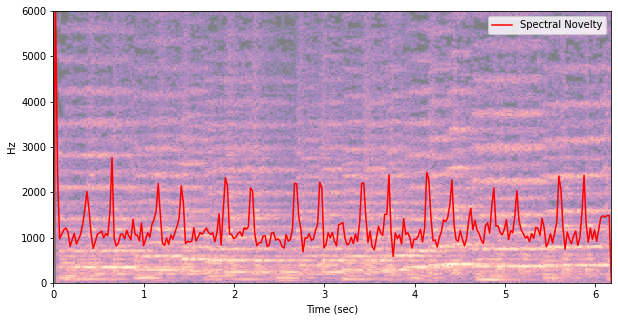

In [16]:
# Define gamma for log compression
gamma = 100
stft = librosa.stft(signal, n_fft=FRAME_LENGTH, hop_length=HOP_LENGTH)
spec = librosa.amplitude_to_db(1 + gamma * np.abs(stft))

# First-order difference
spec_diff = np.diff(spec)
# Half-wave rectification
spec_diff[spec_diff < 0] = 0
spectral_novelty = np.sum(spec_diff, axis=0)
spectral_novelty = np.concatenate((spectral_novelty, np.array([0])))

frames = np.arange(len(spectral_novelty))
t = librosa.frames_to_time(frames, sr=sr)

# Plot
plt.figure(figsize=(10, 5))
librosa.display.specshow(
    spec,
    sr=sr,
    hop_length=HOP_LENGTH,
    x_axis="time", y_axis="linear",
    alpha=0.5
)
plt.plot(t, spectral_novelty, 'r-')
plt.xlim(0, t.max())
plt.ylim(0, 6000)
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))
plt.show()

To furtherly enhance the properties of the novelty function, we can subtract the local average and normalize the resulting function. [2]

This function is referenced from the Meinard Müller notebook, available [here](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6S1_NoveltySpectral.html).

In [17]:
def compute_local_average(signal, M):
    """Compute local average of signal

    Notebook: C6/C6S1_NoveltySpectral.ipynb

    Args:
        signal (np.ndarray): Signal
        M (int): Determines size (2M+1) in samples of centric window  used for local average

    Returns:
        local_average (np.ndarray): Local average signal
    """
    signal_len = len(signal)
    local_average = np.zeros(signal_len)
    for m in range(signal_len):
        a = max(m - M, 0)
        b = min(m + M + 1, signal_len)
        local_average[m] = (1 / (2 * M + 1)) * np.sum(signal[a:b])
    return local_average

Let's now apply the local average function and plot the resulting novelty function:

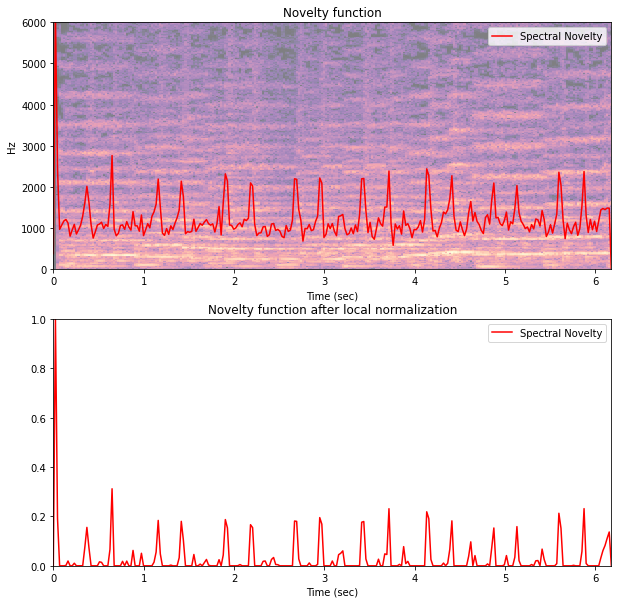

In [18]:
M_sec = 0.1
M = librosa.time_to_frames(M_sec, sr, HOP_LENGTH)

local_average = compute_local_average(spectral_novelty, M)
# Subtract local average
nov_norm =  spectral_novelty - local_average
nov_norm[nov_norm < 0] = 0
# Normalization
nov_norm = nov_norm / max(nov_norm)

# Plot
plt.figure(figsize=(10, 10))

plt.subplot(2, 1, 1)
librosa.display.specshow(
    spec,
    sr=sr,
    hop_length=HOP_LENGTH,
    x_axis="time", y_axis="linear",
    alpha=0.5
)
plt.plot(t, spectral_novelty, 'r-')
plt.xlim(0, t.max())
plt.ylim(0, 6000)
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))
plt.title('Novelty function')

plt.subplot(2, 1, 2)
plt.plot(t, nov_norm, 'r-')
plt.xlim(0, t.max())
plt.ylim(0, 1)
plt.xlabel('Time (sec)')
plt.legend(('Spectral Novelty',))
plt.title('Novelty function after local normalization')
plt.show()

<a id="3-peak-picking"></a>
# 3. Peak Picking

**Peak picking** is the act of locating peaks in a signal. For example, in onset detection, we may want to find peaks in a novelty function. These peaks would correspond to the musical onsets.

Let's go back to the Queen audio sample. Now we will compute a Spectral novelty function and detect the energy peaks. 

For illustrative purposes we will use Librosa's built-in Spectral novelty function, `librosa.onset.onset_strength`. It will compute the spectral flux and return an onset envelope, as we did before.

In [19]:
# Waveform:
signal, sr = librosa.load(QUEEN_PATH)
ipd.Audio(QUEEN_PATH)

In [20]:
spectral_novelty = librosa.onset.onset_strength(signal, sr=sr, hop_length=HOP_LENGTH)

`librosa.util` has a `peak_pick` method, that you can reference in the [documentation](https://librosa.org/doc/main/generated/librosa.util.peak_pick.html). Let's get the onset frames and plot a visual representation: [4]

In [21]:
frames = range(0, len(spectral_novelty))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

# Get the frame indices of the peaks
onset_frames = librosa.util.peak_pick(spectral_novelty, 5, 5, 5, 5, 0.5, 5)
onset_frames

array([  8,  20,  32,  43,  55,  66,  79,  90, 103])

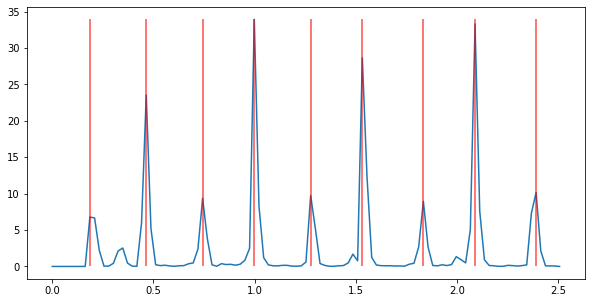

In [22]:
# Plot
plt.figure(figsize=(10, 5))
plt.plot(t, spectral_novelty)
plt.vlines(t[onset_frames], 0, spectral_novelty.max(), color='r', alpha=0.7)
plt.show()

Let's now generate a click track based on the onset frames previously detected, and add it up to the original signal.

Here's the result:

In [23]:
click_track = librosa.clicks(frames=onset_frames, sr=sr, length=len(signal))
ipd.Audio(signal + click_track, rate=sr)

<a id="4-tempo-estimation"></a>
# 4. Tempo Estimation

Tempo refers to the speed of a musical piece. More precisely, it refers to the rate of the musical beat and is given by the reciprocal of the beat period. Tempo is often defined in units of Beats Per Minute (BPM).

The extraction of tempo is a challenging task, as we can face many different problems such as:
- Weak note onsets;
- Local tempo changes (for artistic purposes, as in Romantic piano music: see for example Chopin);
- Syncopation (some of the notes may be "off-beat", or stressed outside of the regular beat placement). [1]

Anyways, tempo estimation relies on two basic assumptions, that is (1) the beat positions occur at note onset positions, and (2) the beat positions are supposed to be equally spaced for a certain period of time (locally).

To perform this task, we will introduce the concept of tempogram.

<a id="5-tempogram"></a>
# 5. Tempogram

The **tempogram** is a similar concept to a spectrogram (which represents the time-frequency content of a given signal).

As in spectrograms, we model a tempogram $\mathcal{T}(t,τ)$ as a function depending on time $t$ (in seconds) and a tempo parameter $τ$ measured in BPM. Intuitively, $\mathcal{T}$ will be a feature matrix which indicates the prevalence of certain tempo at each moment in time, based on a rate $ω = \frac{1}{T}$ and related to the tempo $τ$ by $τ = 60 \cdot ω$. 

For example, a novelty function of onsets that are regularly spaced with period $T = 0.5$ sec corresponds to a rate of $ω = \frac{1}{T} = 2$ Hz or a tempo of $τ = 120$ BPM.

For the sake of semplicity, we are going to focus on two different types of tempogram: **Fourier tempogram** and **Autocorrelation tempogram**. [1] [3]

<a id="5-1-fourier-tempogram"></a>
## 5.1 Fourier Tempogram

The **Fourier Tempogram** is basically the magnitude spectrogram of the novelty function.

Let's load an audio file with a tempo of 72 BPM:

In [24]:
DRUM_PATH = "../input/beat-tracking-audio/DrumLoop_72bpm.wav"

# Waveform:
signal, sr = librosa.load(DRUM_PATH)
ipd.Audio(DRUM_PATH)

Let's now compute and visualize the onset detection using the `librosa.onset.onset_strength` function:

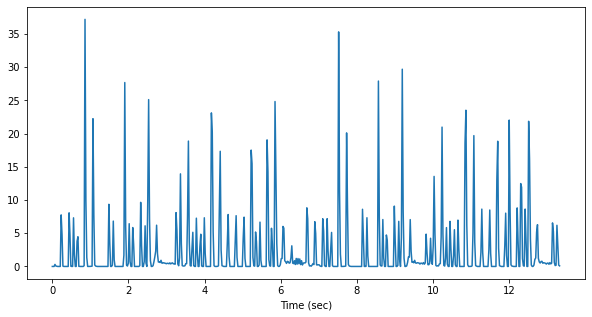

In [25]:
spectral_novelty = librosa.onset.onset_strength(signal, sr=sr, hop_length=HOP_LENGTH)

frames = range(len(spectral_novelty))
t = librosa.frames_to_time(frames, hop_length=HOP_LENGTH)

# Plot
plt.figure(figsize=(10, 5))
plt.plot(t, spectral_novelty)
plt.xlabel('Time (sec)')
plt.show()

Now we compute the Short-time Fourier transform (STFT) of the novelty function. Since the novelty function is computed in frame increments, the hop length of this STFT should be really small:

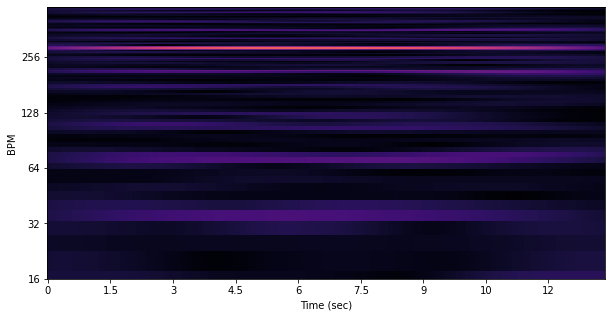

In [26]:
stft = librosa.stft(spectral_novelty, hop_length=1, n_fft=512)
fourier_tempogram = np.abs(stft)

# Plot
plt.figure(figsize=(10, 5))
librosa.display.specshow(fourier_tempogram, x_axis='time', y_axis='fourier_tempo')
plt.xlabel('Time (sec)')
plt.show()

As we can see, the dominant tempo of this drum loop is just above $256$ BPM, and it is roughly constant for the entire piece. In fact, if we quadruple the known tempo of the piece ($72$ BPM) we get tempo $τ = 72 \cdot 4 = 288$ BPM. This is because of the subdivision of the main tempo in sixteenth notes, performed by the hi-hat and of course computed on the onset envelope.  

We can also see on the plote that there is a high correlation around tempo $τ \simeq 70$ BPM and around tempo $τ \simeq 35$ BPM.

<a id="5-2-autocorrelation-tempogram"></a>
## 5.2 Autocorrelation Tempogram

**Autocorrelation** is a different approach, which measures the similarity of a signal with a time-shifted version of itself. For a signal $x$ it is described as:
$$
r(k)=\sum_{n}x(n)x(n−k)
$$

In this equation, $k$ is known as the **lag** paramenter. $r(k)$ is maximized at $k=0$ and is symmetric about $k$. The autocorrelation is useful for finding repeated patterns in a signal, such as tempo (but also other features, e.g. fundamental frequency). [1]

Now let's consider a segment from the Novelty function we computed before:

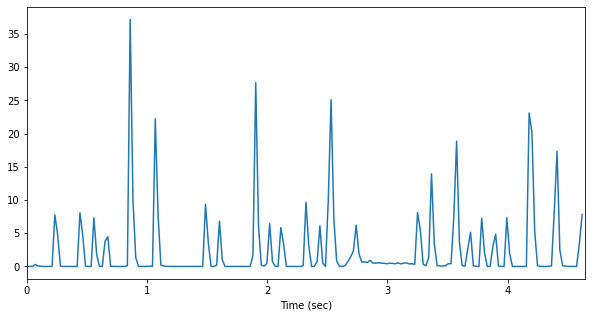

In [27]:
# in frames
n0 = 0
n1 = 200

plt.figure(figsize=(10, 5))
plt.plot(t[n0:n1], spectral_novelty[n0:n1])
plt.xlim(t[n0], t[n1])
plt.xlabel('Time (sec)')
plt.show()

We will use the `librosa.autocorrelate` function to compute the autocorrelation of the given segment, and then convert the time-lag representation to the **autocorrelation tempogram** by multiplying for $60$ the inverse of the time lag in seconds:

$$
τ = \frac{1}{frames\cdot time (sec)} \cdot 60
$$

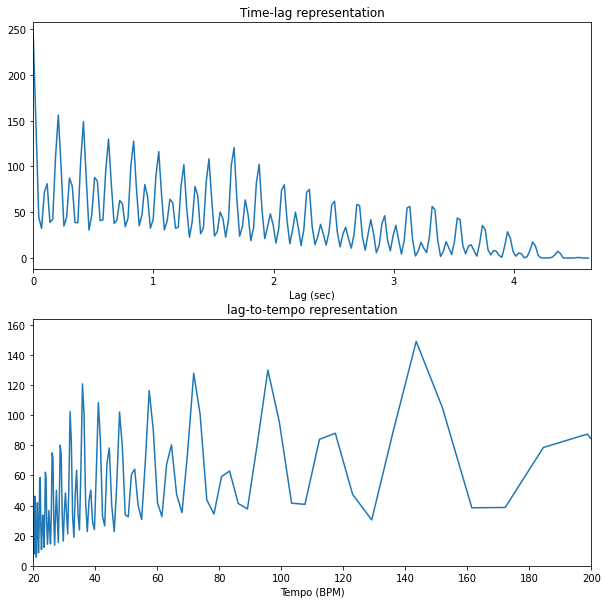

In [28]:
tmp = np.log1p(spectral_novelty[n0:n1])
autocorrelation = librosa.autocorrelate(tmp)

plt.figure(figsize=(10, 10))
plt.subplot(2, 1, 1)
plt.plot(t[:n1-n0], autocorrelation)
plt.xlim(t[0], t[n1-n0])
plt.xlabel('Lag (sec)')
plt.title("Time-lag representation")

# Compute lag to tempo conversion
# [1 -> ] starting from index 1 to avoid dividing by zero
lag_to_tempo = 60/t[1:n1-n0]

plt.subplot(2, 1, 2)
plt.plot(lag_to_tempo, autocorrelation[1:])
plt.xlim(20, 200)
plt.xlabel('Tempo (BPM)')
plt.ylim(0)
plt.title("lag-to-tempo representation")

plt.show()

Wherever the autocorrelation is high is a good candidate of the beat period: [3] we can see that we have a strong correlation just above $140$ BPM.

Librosa's built-in function `librosa.feature.tempogram` calculates an autocorrelation tempogram, applied at every segment (window) in the novelty function. [5]

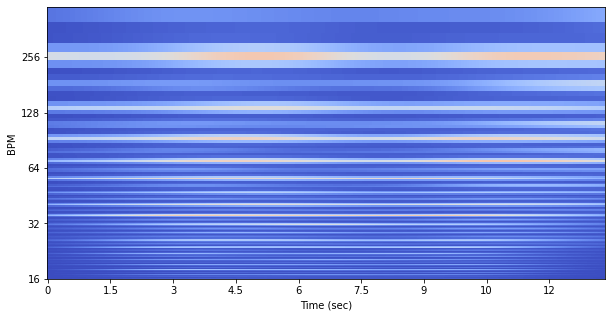

In [29]:
tempogram = librosa.feature.tempogram(
    onset_envelope=spectral_novelty,
    sr=sr, 
    hop_length=HOP_LENGTH, 
    win_length=384
)

plt.figure(figsize=(10, 5))
librosa.display.specshow(tempogram, x_axis='time', y_axis='tempo')
plt.xlabel('Time (sec)')
plt.show()

The highest correlation is around $256$ BPM.

<a id="6-global-tempo-estimation"></a>
# 6. Global Tempo Estimation

We are gonna use `librosa.beat.tempo` to estimate the global tempo of a piece of music.

By looking at the [documentation](https://librosa.org/doc/main/_modules/librosa/beat.html#tempo), we can see that this function performs an `onset_strength` (Spectral novelty) calculation to estimate the global BPM of the song.

Let's load the audio file:

In [30]:
ACDC_PATH = "../input/beat-tracking-audio/BIB_ACDC_intro.wav"

signal, sr = librosa.load(ACDC_PATH)
ipd.Audio(ACDC_PATH)

In [31]:
tempo = librosa.beat.tempo(signal, sr=sr)
print(tempo)

[89.10290948]


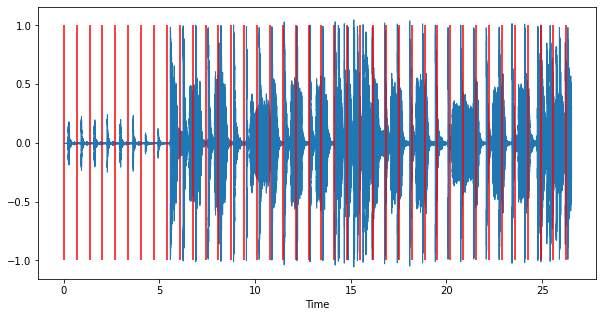

In [32]:
T = len(signal)/float(sr)
seconds_per_beat = 60.0/tempo[0]
beat_times = np.arange(0, T, seconds_per_beat)

plt.figure(figsize=(10,5))
librosa.display.waveshow(signal)
plt.vlines(beat_times, -1, 1, color='r')
plt.show()

Let's hear the result:

In [33]:
click_track = librosa.clicks(beat_times, sr=sr, length=len(signal))
ipd.Audio(signal + click_track, rate=sr)

<a id="7-resources"></a>
# 7. Resources

[1] [Meinard Müller. “Fundamentals of Music Processing”. Springer. 2015 - 2021.](https://link.springer.com/book/10.1007/978-3-319-21945-5)

[2] [Meinard Müller et alia. “FMP Notebooks”. 2019.](https://www.audiolabs-erlangen.de/resources/MIR/FMP/C6/C6.html)

[3] [Steve Tjoa. “Notes on Music Information Retrieval”. 2014.](https://musicinformationretrieval.com/)

[4] [Boeck, Sebastian, Florian Krebs, and Markus Schedl. “Evaluating the Online Capabilities of Onset Detection Methods.” ISMIR. 2012.](http://www.cp.jku.at/research/papers/Boeck_etal_ISMIR_2012.pdf)

[5] [Grosche, Peter, Meinard Müller, and Frank Kurth. “Cyclic tempogram - A mid-level tempo representation for music signals.” ICASSP, 2010.](https://resources.mpi-inf.mpg.de/MIR/tempogramtoolbox/2010_GroscheMuellerKurth_TempogramCyclic_ICASSP.pdf)
